# Convolutions

In this lab, we'll look in detail at convolutions and how they can be used to process images.

### Reading and opening images

We'll use the `skimage` library to read and process images. It's a library dedicated to image processing, which is part of the `scikit-learn` family.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import skimage

sample image shape:  (400, 600, 3)


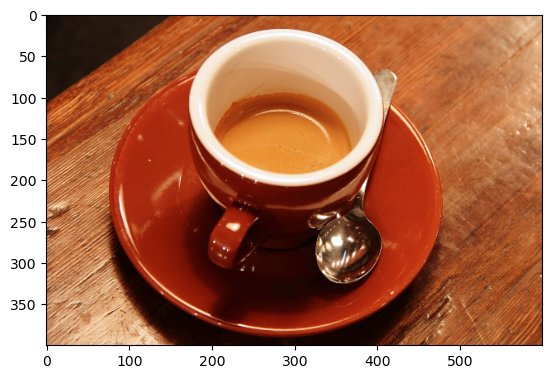

In [2]:
sample_image = skimage.data.coffee()

size = sample_image.shape
print("sample image shape: ", sample_image.shape)

plt.imshow(sample_image.astype('uint8'));

### A simple convolution filter

Before we start working on training any models, let's look at applying a convolution filter to an image. We'll use the `Conv2D` layer from Keras to do this.

In [3]:
from tensorflow.keras.layers import Conv2D

In [4]:
conv = Conv2D(filters=3, kernel_size=(5, 5), padding="same")

Remember: in Keras, `None` is used as a marker for tensor dimensions with dynamic size. In this case `batch_size`, `width` and `height` are all dynamic: they can depend on the input. This is a neat feature of convolutional neural networks: the same model can be used to process images of any size, because all we have to do is slide the convolutional filter across the image as much as necessary.

In [5]:
sample_image.shape

(400, 600, 3)

In [6]:
img_in = np.expand_dims(sample_image, 0).astype(float)
img_in.shape

(1, 400, 600, 3)

In [7]:
img_out = conv(img_in) # Apply the convolutional filter

2025-07-29 18:43:48.837862: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2025-07-29 18:43:48.837911: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2025-07-29 18:43:48.837924: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
2025-07-29 18:43:48.838463: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-07-29 18:43:48.839133: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


The output is a tensorflow Eager Tensor - a special data structure that is used to represent the result of operations in TensorFlow. It is not a numpy array, but it can be converted to one using the `.numpy()` method:

In [8]:
np_img_out = img_out[0].numpy()
print(type(np_img_out))
print(np_img_out.shape)

<class 'numpy.ndarray'>
(400, 600, 3)


/var/folders/xs/w60hxvws49nbndc6b_91qs4w0000gn/T/ipykernel_65612/883366162.py:3: RuntimeWarning: invalid value encountered in cast
  ax1.imshow(np_img_out.astype('uint8'));


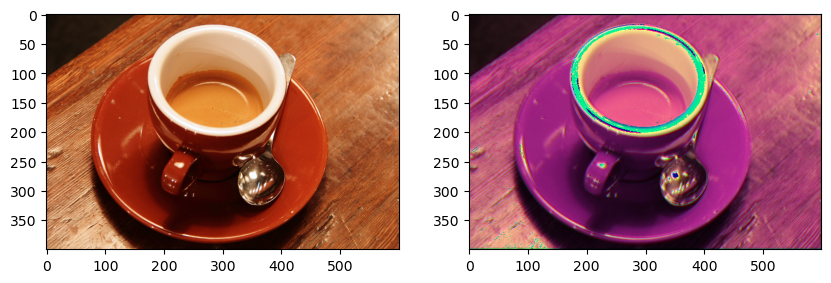

In [9]:
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(10, 5))
ax0.imshow(sample_image.astype('uint8'))
ax1.imshow(np_img_out.astype('uint8'));

As we can see, our convolutional filter was initialized randomly, so our output doesn't contain any specific meaning. Each pixel is a random combination of the pixels in the input image, in a 5x5 window.

Let's instead take a look at a convolutional feature with a clear purpose. We can build a kernel ourselves, by defining a function which will be passed to `Conv2D` Layer.
We'll create an array with 1/25 for filters, with each channel seperated. Before you move to the next cell, can you guess what this filter will do?

In [10]:
def my_kernel(shape=(5, 5, 3, 3), dtype=None):
    array = np.zeros(shape=shape, dtype="float32")
    array[:, :, 0, 0] = 1 / 25
    array[:, :, 1, 1] = 1 / 25
    array[:, :, 2, 2] = 1 / 25
    return array

Now we can use this function to initialize a `Conv2D` layer:

In [11]:
conv = Conv2D(filters=3, kernel_size=(5, 5), padding="same", kernel_initializer=my_kernel)

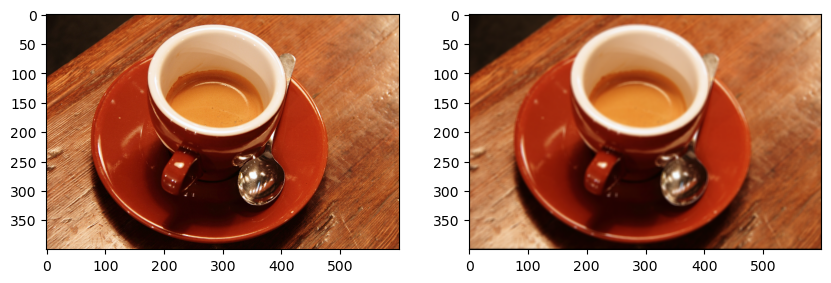

In [12]:
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(10, 5))
ax0.imshow(img_in[0].astype('uint8'))

img_out = conv(img_in)
np_img_out = img_out[0].numpy()
ax1.imshow(np_img_out.astype('uint8'));

Hopefully you can tell what this filter does!

**Exercise**
- There are a number of settings when we define our Conv2D layer. Try changing the following parameters to get a sense of how they impact the result:
- kernel_size: try different sizes
- padding: try 'valid' instead of 'same' (hint: this may change the size of the output)

Original image shape: (1, 400, 600, 3)
1. EXPERIMENTING WITH DIFFERENT KERNEL SIZES
----------------------------------------
Kernel size (3, 3): Output shape = (1, 400, 600, 3)
Kernel size (5, 5): Output shape = (1, 400, 600, 3)
Kernel size (7, 7): Output shape = (1, 400, 600, 3)


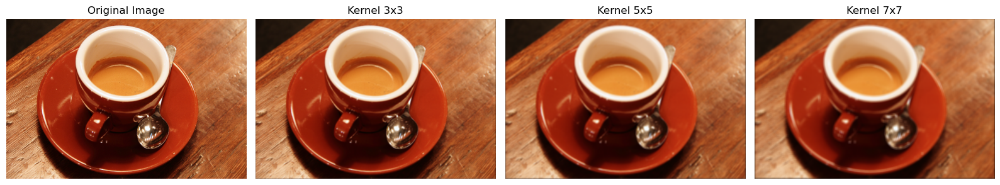


2. EXPERIMENTING WITH PADDING: 'same' vs 'valid'
----------------------------------------
Padding 'same', Kernel (3, 3): Input (1, 400, 600, 3) -> Output (1, 400, 600, 3)
Padding 'same', Kernel (7, 7): Input (1, 400, 600, 3) -> Output (1, 400, 600, 3)
Padding 'valid', Kernel (3, 3): Input (1, 400, 600, 3) -> Output (1, 398, 598, 3)
Padding 'valid', Kernel (7, 7): Input (1, 400, 600, 3) -> Output (1, 394, 594, 3)


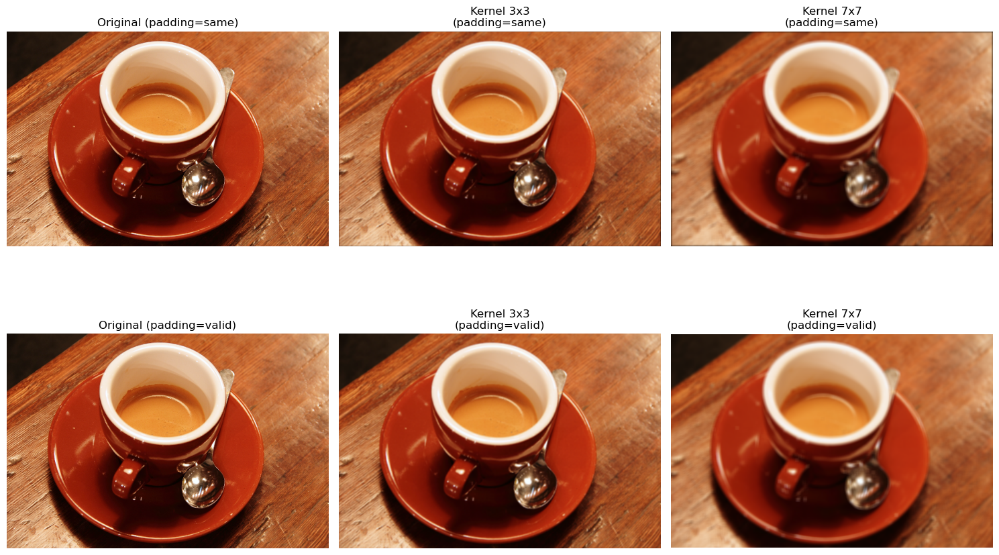


3. DETAILED ANALYSIS OF PADDING EFFECTS
----------------------------------------
Original image dimensions: (1, 400, 600, 3)
Kernel (3, 3), padding='same': (1, 400, 600, 3) -> (1, 400, 600, 3) (size change: (0, 0))
Kernel (3, 3), padding='valid': (1, 400, 600, 3) -> (1, 398, 598, 3) (size change: (2, 2))
Kernel (5, 5), padding='same': (1, 400, 600, 3) -> (1, 400, 600, 3) (size change: (0, 0))
Kernel (5, 5), padding='valid': (1, 400, 600, 3) -> (1, 396, 596, 3) (size change: (4, 4))
Kernel (7, 7), padding='same': (1, 400, 600, 3) -> (1, 400, 600, 3) (size change: (0, 0))
Kernel (7, 7), padding='valid': (1, 400, 600, 3) -> (1, 394, 594, 3) (size change: (6, 6))
Kernel (9, 9), padding='same': (1, 400, 600, 3) -> (1, 400, 600, 3) (size change: (0, 0))
Kernel (9, 9), padding='valid': (1, 400, 600, 3) -> (1, 392, 592, 3) (size change: (8, 8))

4. OBSERVATIONS AND EXPLANATIONS
----------------------------------------
KERNEL SIZE EFFECTS:
- Larger kernels create more blurred/smoother images
-

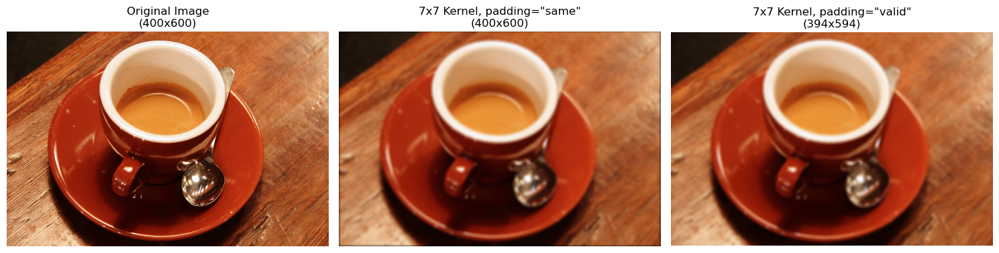


With 'valid' padding and 7x7 kernel:
Height: 400 -> 394 (reduced by 6)
Width: 600 -> 594 (reduced by 6)


In [13]:
# Experimenting with different Conv2D parameters

print("Original image shape:", img_in.shape)
print("=" * 50)

# Create different kernel initialization functions for different sizes
def my_kernel_3x3(shape=(3, 3, 3, 3), dtype=None):
    array = np.zeros(shape=shape, dtype="float32")
    array[:, :, 0, 0] = 1 / 9  # 3x3 = 9 pixels
    array[:, :, 1, 1] = 1 / 9
    array[:, :, 2, 2] = 1 / 9
    return array

def my_kernel_7x7(shape=(7, 7, 3, 3), dtype=None):
    array = np.zeros(shape=shape, dtype="float32")
    array[:, :, 0, 0] = 1 / 49  # 7x7 = 49 pixels
    array[:, :, 1, 1] = 1 / 49
    array[:, :, 2, 2] = 1 / 49
    return array

# 1. Experiment with different kernel sizes
print("1. EXPERIMENTING WITH DIFFERENT KERNEL SIZES")
print("-" * 40)

kernel_sizes = [(3, 3), (5, 5), (7, 7)]
kernel_funcs = [my_kernel_3x3, my_kernel, my_kernel_7x7]

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(img_in[0].astype('uint8'))
axes[0].set_title('Original Image')
axes[0].axis('off')

for i, (kernel_size, kernel_func) in enumerate(zip(kernel_sizes, kernel_funcs)):
    conv = Conv2D(filters=3, kernel_size=kernel_size, padding="same", 
                  kernel_initializer=kernel_func)
    img_out = conv(img_in)
    np_img_out = img_out[0].numpy()
    
    print(f"Kernel size {kernel_size}: Output shape = {img_out.shape}")
    
    axes[i+1].imshow(np_img_out.astype('uint8'))
    axes[i+1].set_title(f'Kernel {kernel_size[0]}x{kernel_size[1]}')
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "=" * 50)
print("2. EXPERIMENTING WITH PADDING: 'same' vs 'valid'")
print("-" * 40)

# 2. Experiment with padding
padding_types = ['same', 'valid']

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for row, padding in enumerate(padding_types):
    axes[row, 0].imshow(img_in[0].astype('uint8'))
    axes[row, 0].set_title(f'Original (padding={padding})')
    axes[row, 0].axis('off')
    
    for col, kernel_size in enumerate([(3, 3), (7, 7)]):
        if kernel_size == (3, 3):
            kernel_func = my_kernel_3x3
        else:
            kernel_func = my_kernel_7x7
            
        conv = Conv2D(filters=3, kernel_size=kernel_size, padding=padding,
                      kernel_initializer=kernel_func)
        img_out = conv(img_in)
        np_img_out = img_out[0].numpy()
        
        print(f"Padding '{padding}', Kernel {kernel_size}: Input {img_in.shape} -> Output {img_out.shape}")
        
        axes[row, col+1].imshow(np_img_out.astype('uint8'))
        axes[row, col+1].set_title(f'Kernel {kernel_size[0]}x{kernel_size[1]}\n(padding={padding})')
        axes[row, col+1].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "=" * 50)
print("3. DETAILED ANALYSIS OF PADDING EFFECTS")
print("-" * 40)

# 3. More detailed analysis of padding effects
print("Original image dimensions:", img_in.shape)

for kernel_size in [(3, 3), (5, 5), (7, 7), (9, 9)]:
    for padding in ['same', 'valid']:
        if kernel_size == (3, 3):
            kernel_func = my_kernel_3x3
        elif kernel_size == (5, 5):
            kernel_func = my_kernel
        elif kernel_size == (7, 7):
            kernel_func = my_kernel_7x7
        else:  # 9x9
            def my_kernel_9x9(shape=(9, 9, 3, 3), dtype=None):
                array = np.zeros(shape=shape, dtype="float32")
                array[:, :, 0, 0] = 1 / 81  # 9x9 = 81 pixels
                array[:, :, 1, 1] = 1 / 81
                array[:, :, 2, 2] = 1 / 81
                return array
            kernel_func = my_kernel_9x9
            
        conv = Conv2D(filters=3, kernel_size=kernel_size, padding=padding,
                      kernel_initializer=kernel_func)
        img_out = conv(img_in)
        
        size_change = (img_in.shape[1] - img_out.shape[1], img_in.shape[2] - img_out.shape[2])
        print(f"Kernel {kernel_size}, padding='{padding}': {img_in.shape} -> {img_out.shape} (size change: {size_change})")

print("\n" + "=" * 50)
print("4. OBSERVATIONS AND EXPLANATIONS")
print("-" * 40)
print("KERNEL SIZE EFFECTS:")
print("- Larger kernels create more blurred/smoother images")
print("- Smaller kernels preserve more detail")
print("- The blur effect increases with kernel size because we're averaging over more pixels")
print()
print("PADDING EFFECTS:")
print("- 'same' padding: Output size = Input size (adds zero padding)")
print("- 'valid' padding: Output size = Input size - Kernel size + 1 (no padding)")
print("- 'valid' padding reduces output dimensions, especially with larger kernels")
print("- For a kernel of size k, 'valid' padding reduces each dimension by (k-1)")

# 4. Demonstrate edge effects with valid padding
print("\n" + "=" * 50)
print("5. EDGE EFFECTS VISUALIZATION")
print("-" * 40)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original
axes[0].imshow(img_in[0].astype('uint8'))
axes[0].set_title('Original Image\n(400x600)')
axes[0].axis('off')

# Same padding
conv_same = Conv2D(filters=3, kernel_size=(7, 7), padding="same", kernel_initializer=my_kernel_7x7)
img_out_same = conv_same(img_in)
axes[1].imshow(img_out_same[0].numpy().astype('uint8'))
axes[1].set_title('7x7 Kernel, padding="same"\n(400x600)')
axes[1].axis('off')

# Valid padding
conv_valid = Conv2D(filters=3, kernel_size=(7, 7), padding="valid", kernel_initializer=my_kernel_7x7)
img_out_valid = conv_valid(img_in)
axes[2].imshow(img_out_valid[0].numpy().astype('uint8'))
axes[2].set_title(f'7x7 Kernel, padding="valid"\n({img_out_valid.shape[1]}x{img_out_valid.shape[2]})')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print(f"\nWith 'valid' padding and 7x7 kernel:")
print(f"Height: {img_in.shape[1]} -> {img_out_valid.shape[1]} (reduced by {img_in.shape[1] - img_out_valid.shape[1]})")
print(f"Width: {img_in.shape[2]} -> {img_out_valid.shape[2]} (reduced by {img_in.shape[2] - img_out_valid.shape[2]})")

### Working on edge detection on Grayscale image

Using a grayscale image, let's build an "edge detector" using a convolutional filter. Some filters pre-date the deep learning era and are still used today. For example, the Sobel filter is used to detect edges in images. These easy-to-compute filters were used in the early days of computer vision and are still useful now.

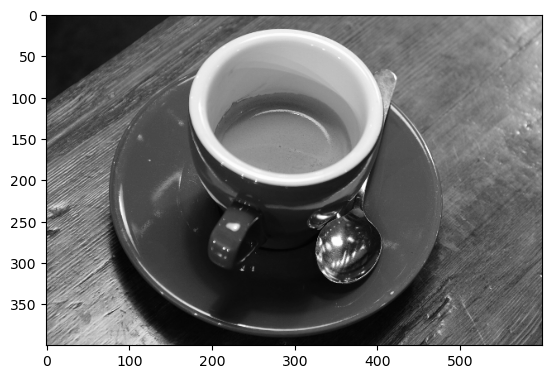

In [14]:
# convert image to greyscale
grey_sample_image = sample_image.mean(axis=2)

# add the channel dimension even if it's only one channel so
# to be consistent with Keras expectations.
grey_sample_image = grey_sample_image[:, :, np.newaxis]

# matplotlib does not like the extra dim for the color channel
# when plotting gray-level images. Let's use squeeze:
plt.imshow(np.squeeze(grey_sample_image.astype(np.uint8)),
           cmap=plt.cm.gray);

**Exercise**
- Build an edge detector using `Conv2D` on greyscale image by defining the kernel inside `my_kernel`.
- You may experiment with several kernels to find a way to detect edges. The following article contains specific examples of kernels that you can use:
- https://en.wikipedia.org/wiki/Kernel_(image_processing)
- Try different kernels and see the impact on the output.

EDGE DETECTION EXPERIMENTS


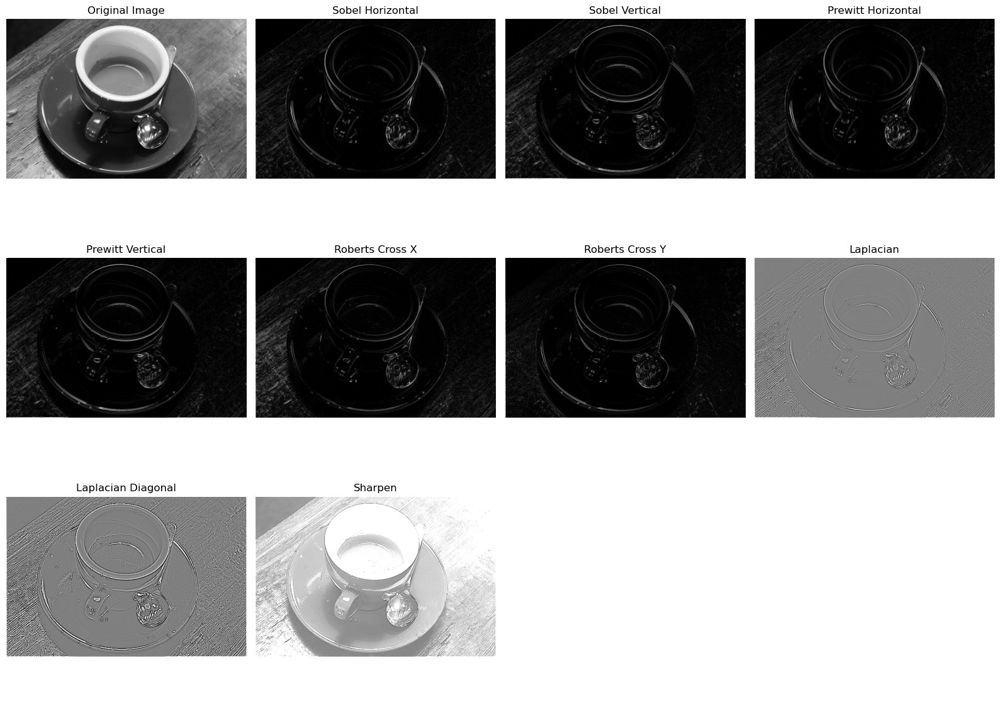


DETAILED ANALYSIS OF EDGE DETECTION KERNELS
--------------------------------------------------
1. SOBEL OPERATORS COMPARISON


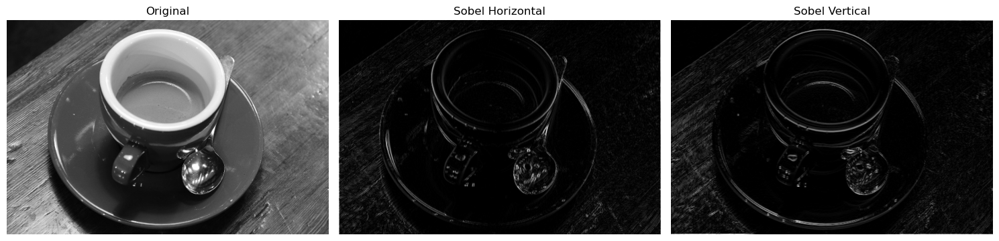


2. COMBINED SOBEL EDGE DETECTION


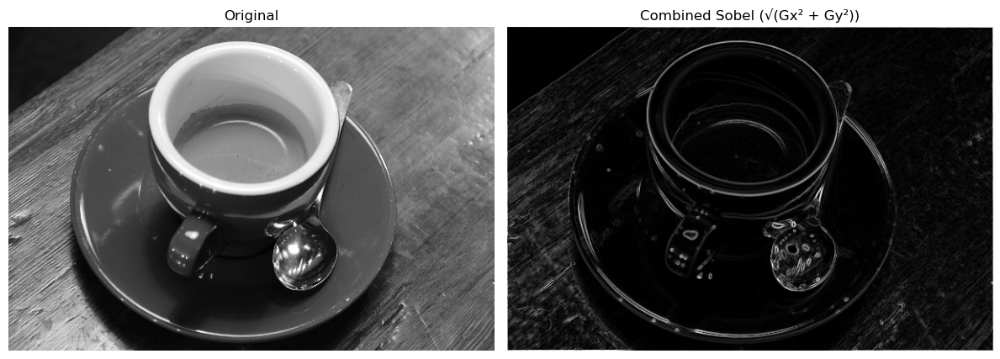


3. LAPLACIAN vs LAPLACIAN WITH DIAGONALS


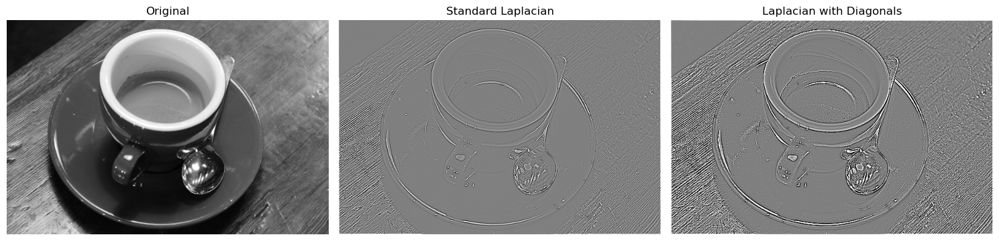


KERNEL ANALYSIS:
------------------------------
SOBEL OPERATORS:
- Sobel horizontal: Detects vertical edges (left-right transitions)
- Sobel vertical: Detects horizontal edges (top-bottom transitions)
- Uses weighted averaging (center pixels have weight 2)
- Good noise suppression due to smoothing

PREWITT OPERATORS:
- Similar to Sobel but with equal weights
- Less noise suppression than Sobel
- Simpler computation

ROBERTS CROSS:
- Simple 2x2 gradient operator
- Detects diagonal edges
- More sensitive to noise
- Faster computation

LAPLACIAN:
- Second derivative operator
- Detects edges regardless of direction
- Very sensitive to noise
- Creates thin edge lines
- Can produce negative values (shown as dark pixels)

SHARPENING:
- Enhances edges and details
- Can be seen as original + Laplacian
- Makes image appear more crisp

4. KERNEL VALUES
------------------------------

Sobel Horizontal:
[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]

Sobel Vertical:
[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]

Lap

In [16]:
# Edge detection using different kernels from Wikipedia

print("EDGE DETECTION EXPERIMENTS")
print("=" * 50)

# Define different edge detection kernels
def sobel_horizontal_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Sobel operator for horizontal edge detection"""
    array = np.array([[-1, 0, 1],
                      [-2, 0, 2],
                      [-1, 0, 1]], dtype="float32")
    return array.reshape(*shape)

def sobel_vertical_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Sobel operator for vertical edge detection"""
    array = np.array([[-1, -2, -1],
                      [ 0,  0,  0],
                      [ 1,  2,  1]], dtype="float32")
    return array.reshape(*shape)

def prewitt_horizontal_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Prewitt operator for horizontal edge detection"""
    array = np.array([[-1, 0, 1],
                      [-1, 0, 1],
                      [-1, 0, 1]], dtype="float32")
    return array.reshape(*shape)

def prewitt_vertical_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Prewitt operator for vertical edge detection"""
    array = np.array([[-1, -1, -1],
                      [ 0,  0,  0],
                      [ 1,  1,  1]], dtype="float32")
    return array.reshape(*shape)

def roberts_cross_x_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Roberts Cross-gradient (X direction)"""
    array = np.array([[ 1,  0,  0],
                      [ 0, -1,  0],
                      [ 0,  0,  0]], dtype="float32")
    return array.reshape(*shape)

def roberts_cross_y_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Roberts Cross-gradient (Y direction)"""
    array = np.array([[ 0,  1,  0],
                      [-1,  0,  0],
                      [ 0,  0,  0]], dtype="float32")
    return array.reshape(*shape)

def laplacian_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Laplacian operator for edge detection"""
    array = np.array([[ 0, -1,  0],
                      [-1,  4, -1],
                      [ 0, -1,  0]], dtype="float32")
    return array.reshape(*shape)

def laplacian_diagonal_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Laplacian with diagonal neighbors"""
    array = np.array([[-1, -1, -1],
                      [-1,  8, -1],
                      [-1, -1, -1]], dtype="float32")
    return array.reshape(*shape)

def sharpen_kernel(shape=(3, 3, 1, 1), dtype=None):
    """Sharpening kernel"""
    array = np.array([[ 0, -1,  0],
                      [-1,  5, -1],
                      [ 0, -1,  0]], dtype="float32")
    return array.reshape(*shape)

# List of kernels to test
kernels = [
    ("Sobel Horizontal", sobel_horizontal_kernel),
    ("Sobel Vertical", sobel_vertical_kernel),
    ("Prewitt Horizontal", prewitt_horizontal_kernel),
    ("Prewitt Vertical", prewitt_vertical_kernel),
    ("Roberts Cross X", roberts_cross_x_kernel),
    ("Roberts Cross Y", roberts_cross_y_kernel),
    ("Laplacian", laplacian_kernel),
    ("Laplacian Diagonal", laplacian_diagonal_kernel),
    ("Sharpen", sharpen_kernel)
]

# Apply each kernel and visualize results
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()

# Original image
axes[0].imshow(np.squeeze(grey_sample_image.astype(np.uint8)), cmap=plt.cm.gray)
axes[0].set_title('Original Image')
axes[0].axis('off')

img_in = np.expand_dims(grey_sample_image, 0)  # Reshape into a batch of size 1

for i, (kernel_name, kernel_func) in enumerate(kernels):
    conv = Conv2D(filters=1, kernel_size=(3, 3), padding="same", kernel_initializer=kernel_func)
    img_out = conv(img_in)
    np_img_out = img_out[0].numpy()
    
    # For better visualization, we'll apply different scaling strategies
    if "Laplacian" in kernel_name or "Sharpen" in kernel_name:
        # For Laplacian and sharpening, clip values to valid range
        display_img = np.clip(np_img_out + 128, 0, 255)  # Shift and clip
    else:
        # For edge detection, use absolute values and normalize
        display_img = np.abs(np_img_out)
        display_img = (display_img / display_img.max() * 255) if display_img.max() > 0 else display_img
    
    axes[i+1].imshow(np.squeeze(display_img.astype(np.uint8)), cmap=plt.cm.gray)
    axes[i+1].set_title(kernel_name)
    axes[i+1].axis('off')

# Hide remaining subplots
for i in range(len(kernels) + 1, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print("\nDETAILED ANALYSIS OF EDGE DETECTION KERNELS")
print("-" * 50)

# More detailed analysis with side-by-side comparisons
print("1. SOBEL OPERATORS COMPARISON")
sobel_kernels = [("Sobel Horizontal", sobel_horizontal_kernel), 
                 ("Sobel Vertical", sobel_vertical_kernel)]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(np.squeeze(grey_sample_image.astype(np.uint8)), cmap=plt.cm.gray)
axes[0].set_title('Original')
axes[0].axis('off')

sobel_results = []
for i, (name, kernel_func) in enumerate(sobel_kernels):
    conv = Conv2D(filters=1, kernel_size=(3, 3), padding="same", kernel_initializer=kernel_func)
    img_out = conv(img_in)
    np_img_out = img_out[0].numpy()
    sobel_results.append(np_img_out)
    
    display_img = np.abs(np_img_out)
    display_img = (display_img / display_img.max() * 255) if display_img.max() > 0 else display_img
    
    axes[i+1].imshow(np.squeeze(display_img.astype(np.uint8)), cmap=plt.cm.gray)
    axes[i+1].set_title(name)
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

# Combine Sobel horizontal and vertical
print("\n2. COMBINED SOBEL EDGE DETECTION")
sobel_combined = np.sqrt(sobel_results[0]**2 + sobel_results[1]**2)
sobel_combined_normalized = (sobel_combined / sobel_combined.max() * 255) if sobel_combined.max() > 0 else sobel_combined

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(np.squeeze(grey_sample_image.astype(np.uint8)), cmap=plt.cm.gray)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(np.squeeze(sobel_combined_normalized.astype(np.uint8)), cmap=plt.cm.gray)
axes[1].set_title('Combined Sobel (√(Gx² + Gy²))')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print("\n3. LAPLACIAN vs LAPLACIAN WITH DIAGONALS")
laplacian_kernels = [("Standard Laplacian", laplacian_kernel),
                     ("Laplacian with Diagonals", laplacian_diagonal_kernel)]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(np.squeeze(grey_sample_image.astype(np.uint8)), cmap=plt.cm.gray)
axes[0].set_title('Original')
axes[0].axis('off')

for i, (name, kernel_func) in enumerate(laplacian_kernels):
    conv = Conv2D(filters=1, kernel_size=(3, 3), padding="same", kernel_initializer=kernel_func)
    img_out = conv(img_in)
    np_img_out = img_out[0].numpy()
    
    # For Laplacian, show both positive and negative edges
    display_img = np.clip(np_img_out + 128, 0, 255)
    
    axes[i+1].imshow(np.squeeze(display_img.astype(np.uint8)), cmap=plt.cm.gray)
    axes[i+1].set_title(name)
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

print("\nKERNEL ANALYSIS:")
print("-" * 30)
print("SOBEL OPERATORS:")
print("- Sobel horizontal: Detects vertical edges (left-right transitions)")
print("- Sobel vertical: Detects horizontal edges (top-bottom transitions)")
print("- Uses weighted averaging (center pixels have weight 2)")
print("- Good noise suppression due to smoothing")

print("\nPREWITT OPERATORS:")
print("- Similar to Sobel but with equal weights")
print("- Less noise suppression than Sobel")
print("- Simpler computation")

print("\nROBERTS CROSS:")
print("- Simple 2x2 gradient operator")
print("- Detects diagonal edges")
print("- More sensitive to noise")
print("- Faster computation")

print("\nLAPLACIAN:")
print("- Second derivative operator")
print("- Detects edges regardless of direction")
print("- Very sensitive to noise")
print("- Creates thin edge lines")
print("- Can produce negative values (shown as dark pixels)")

print("\nSHARPENING:")
print("- Enhances edges and details")
print("- Can be seen as original + Laplacian")
print("- Makes image appear more crisp")

# Display the actual kernel values
print("\n4. KERNEL VALUES")
print("-" * 30)
sample_kernels = [
    ("Sobel Horizontal", np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])),
    ("Sobel Vertical", np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])),
    ("Laplacian", np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])),
]

for name, kernel in sample_kernels:
    print(f"\n{name}:")
    print(kernel)

### Pooling and strides with convolutions

**Exercise**
- Use `MaxPool2D` to apply a 2x2 max pool with strides 2 to the image. What is the impact on the shape of the image?
- Use `AvgPool2D` to apply an average pooling.
- Is it possible to compute a max pooling and an average pooling with well chosen kernels?

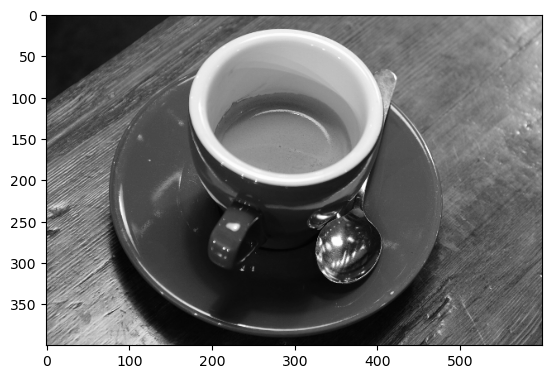

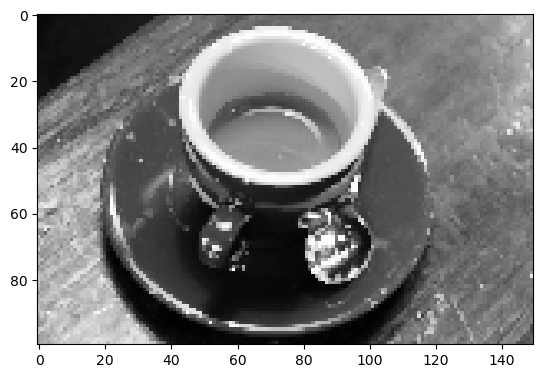

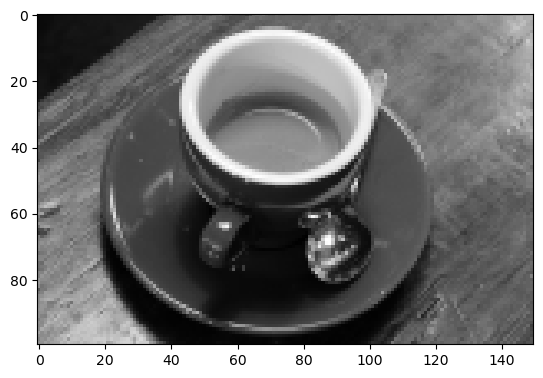

In [17]:
from tensorflow.keras.layers import MaxPool2D, AvgPool2D

# You can use `img_in` from above as input to the pooling layers

plt.figure()
plt.imshow(np.squeeze(grey_sample_image.astype(np.uint8)),
           cmap=plt.cm.gray);

pool = MaxPool2D(pool_size=(4, 4), strides=(4, 4), padding="valid")

img_out = pool(img_in)
np_img_out = img_out[0].numpy()

plt.figure()
plt.imshow(np.squeeze(np_img_out.astype(np.uint8)),
              cmap=plt.cm.gray);

pool = AvgPool2D(pool_size=(4, 4), strides=(4, 4), padding="valid")

img_out = pool(img_in)
np_img_out = img_out[0].numpy()

plt.figure()
plt.imshow(np.squeeze(np_img_out.astype(np.uint8)),
                cmap=plt.cm.gray);

## Loading a JPEG file as a numpy array

Let's use [scikit-image](http://scikit-image.rg) to load the content of a JPEG file into a numpy array:

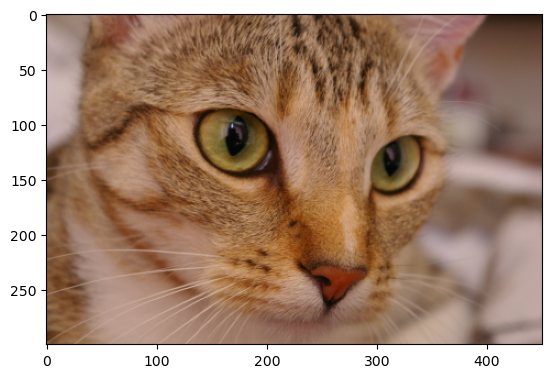

In [18]:
from skimage.io import imread

image = skimage.data.cat()
plt.imshow(image);

## Resizing images, handling data types and dynamic ranges

While convolutions can handle inputs of any size, it is often useful to resize images to a fixed size. This is particularly important for training deep learning models:

- for **image classification**, most networks expect a specific **fixed input size**;

- for **object detection** and instance segmentation, networks have more flexibility but the image should have **approximately the same size as the training set images**.

Furthermore **large images can be much slower to process** than smaller images (the number of pixels varies quadratically with the height and width).

In [19]:
from skimage.transform import resize

lowres_image = resize(image, (50, 50), mode='reflect', anti_aliasing=True)
lowres_image.shape

(50, 50, 3)

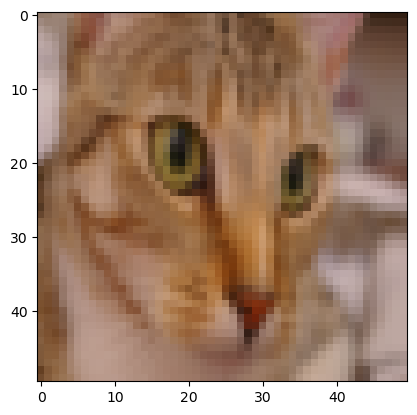

In [20]:
plt.imshow(lowres_image, interpolation='nearest');

The values of the pixels of the low resolution image are computed from by combining the values of the pixels in the high resolution image. The result is therefore represented as floating points.

## Using a pretrained model

Objectives:

- Load a pre-trained ResNet50 pre-trained model using Keras Zoo
- Use the model to classify an image
- Use the model to classify an image from the webcam

Let's start with loading ResNet50, a well-established method for image classification. The ResNet50 "application" takes two key parameters here: firstly, `include_top` indicates whether we want to include the last layer of the network (the classification layer) or not. Secondly, `weights` indicates whether we want to load the weights of a model that has been pre-trained on ImageNet or not.

In [21]:
from tensorflow.keras.applications.resnet50 import ResNet50

model = ResNet50(include_top=True, weights='imagenet')
model.compile(optimizer='sgd', loss='categorical_crossentropy')

102967424/102967424 [==============================] - 2s 0us/step


In [22]:
print(model.summary())

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

### Classification of an image

**Exercise**
- Reshape the `cat` image to the shape `(224, 224, 3)` using `resize` from `skimage.transform`
- Use `preprocess_input` from `tensorflow.keras.applications.imagenet_utils` to preprocess the image
- Use `predict` to classify the image

Documentation for each method:
- [resize](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize)
- [preprocess_input](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet/preprocess_input)
- [predict](https://www.tensorflow.org/api_docs/python/tf/keras/Model#predict)

In [23]:
from keras.applications.resnet50 import preprocess_input, decode_predictions



##  Taking snapshots from the webcam

For this section, we will take an image from your laptop webcam and classify it. If you feel uncomfortable doing this section, you can skip it and use a photo of your choice from the web instead.

In [24]:
import cv2

def camera_grab(camera_id=0, fallback_filename=None):
    camera = cv2.VideoCapture(camera_id)
    try:
        # take 10 consecutive snapshots to let the camera automatically tune
        # itself and hope that the contrast and lighting of the last snapshot
        # is good enough.
        for i in range(10):
            snapshot_ok, image = camera.read()
        if snapshot_ok:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        else:
            print("WARNING: could not access camera")
            if fallback_filename:
                image = imread(fallback_filename)
    finally:
        camera.release()
    return image

[ WARN:0@11.067] global cap_gstreamer.cpp:1173 isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created
OpenCV: not authorized to capture video (status 0), requesting...
OpenCV: camera failed to properly initialize!


[07/29 18:50:38.647512][info][20129273][Context.cpp:69] Context created with config: default config!
[07/29 18:50:38.647531][info][20129273][Context.cpp:74] Context work_dir=/Users/yankylanky/Development/DSI/deep_learning/01_materials/labs
[07/29 18:50:38.647533][info][20129273][Context.cpp:77] 	- SDK version: 1.9.4
[07/29 18:50:38.647534][info][20129273][Context.cpp:78] 	- SDK stage version: main
[07/29 18:50:38.647536][info][20129273][Context.cpp:82] get config EnumerateNetDevice:false
[07/29 18:50:38.647537][info][20129273][MacPal.cpp:36] createObPal: create MacPal!
[07/29 18:50:38.647815][info][20129273][MacPal.cpp:104] Create PollingDeviceWatcher!
[07/29 18:50:38.647822][info][20129273][DeviceManager.cpp:15] Current found device(s): (0)
[07/29 18:50:38.647824][info][20129273][Pipeline.cpp:15] Try to create pipeline with default device.
[07/29 18:50:38.647826][warning][20129273][ObException.cpp:5] No device found, fail to create pipeline!
[07/29 18:50:38.648392][info][20129273][Con

[ WARN:0@11.283] global cap.cpp:323 open VIDEOIO(OBSENSOR): raised unknown C++ exception!




TypeError: Image data of dtype object cannot be converted to float

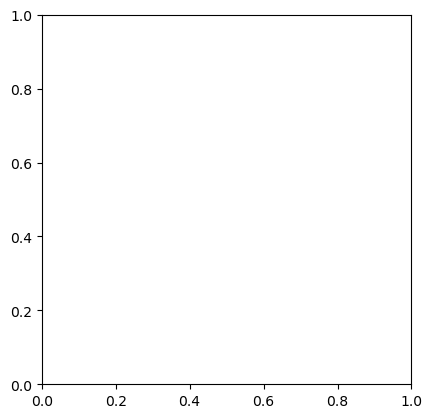

In [25]:
image = camera_grab(camera_id=0, fallback_filename=None)
plt.imshow(image)
print("dtype: {}, shape: {}, range: {}".format(
    image.dtype, image.shape, (image.min(), image.max())))


### Exercise

Apply the same preprocessing as before and classify the image. What are your results?